# Fibroblast to neuron

In [1]:
import phlower
import numpy as np
import pandas as pd
import networkx as nx
from itertools import chain
import scipy
import sklearn
import pydot
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import scanpy as sc
from matplotlib.backends.backend_pdf import PdfPages


In [2]:
%load_ext autoreload
%autoreload 2
import phlower
import importlib
importlib.reload(phlower)
phlower.__version__

'0.1.3'

In [3]:
adata = phlower.dataset.fib2neuro()

### ddhodge to get embeddings and pseudo time

#### Parameters
`basis`: will perform PCA if set to None

`root`: start cell indecies for trajectory

`k`: bandwith for diffusion map affinity

`npc`: number of PCs to use

`ndc`: number of diffusion components to use

`s`: steps for diffusion process

`lstsq_methods`: least square methods for ddhodge potential calculation


In [4]:
phlower.ext.ddhodge(adata, basis=None, roots=(adata.obs.group=="MEF"), k=7,npc=100,ndc=40,s=2, lstsq_method='cholesky', verbose=True)

Normalization: 
done.
Pre-PCA: 
2024-09-27 10:38:50.046613 distance_matrix
2024-09-27 10:38:50.085889 Diffusionmaps: 
done.
2024-09-27 10:38:50.149426 diffusion distance:
2024-09-27 10:38:50.169049 transition matrix:
2024-09-27 10:38:50.174908 graph from A
2024-09-27 10:38:50.175141 Rewiring: 
2024-09-27 10:38:50.175152 div(g_o)...
2024-09-27 10:38:50.350843 edge weight...
2024-09-27 10:38:50.390933 cholesky solve ax=b...
+ 1e-06 I is positive-definite
2024-09-27 10:38:50.396110 grad...
2024-09-27 10:38:50.509950 potential.
2024-09-27 10:38:50.592800 ddhodge done.
done.
2024-09-27 10:38:50.607937 calculate layouts
2024-09-27 10:38:58.920193 done


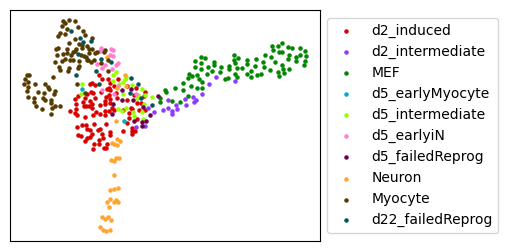

In [5]:

figs = []
fig, ax = plt.subplots(1,1, figsize=(4, 3))
phlower.pl.nxdraw_group(adata,node_size=5, show_edges=False, label=False, ax=ax)

### Delaunay triangulation to construct graph with holes

`cluster_name`: clusters to use, i.e. leiden or louvain

`node_attr`: pseudo time from ddhodge

`start_n, end_n`: how many cells to use to connect start and and clusters 

`circle_quant`: quantile cells of each cluster to use for the starts ends connecting

`calc_layout`: if calculate layout using neato for the graph with holes

In [6]:
phlower.tl.construct_delaunay(adata, cluster_name='group', node_attr='u', start_n=10, end_n=10, circle_quant=0.1, calc_layout=True)

start clusters  ['MEF']
end clusters  ['Neuron', 'Myocyte']


Now we can check the graph with holes and how pseudo time presents in the graph

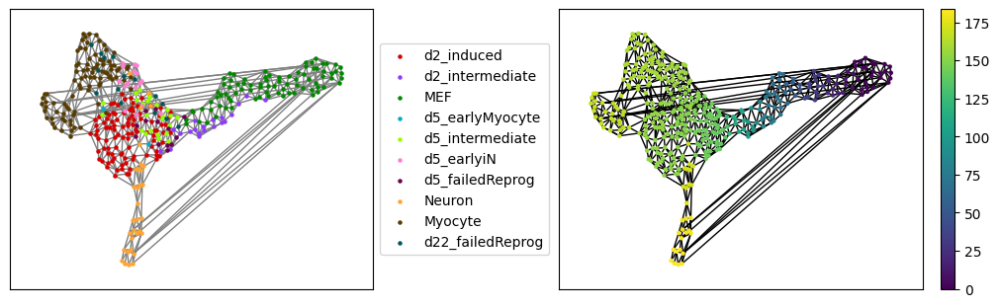

In [7]:
fig, ax = plt.subplots(1,2, figsize=(10, 3),  constrained_layout=True)
phlower.pl.nxdraw_group(adata,  graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5, show_edges=True, show_legend=True, label=False, ax=ax[0])
phlower.pl.nxdraw_score(adata, graph_name="X_pca_ddhodge_g_triangulation_circle",node_size=5,  ax=ax[1], colorbar=True)


We can als check the graph with holes and the triangle distributions

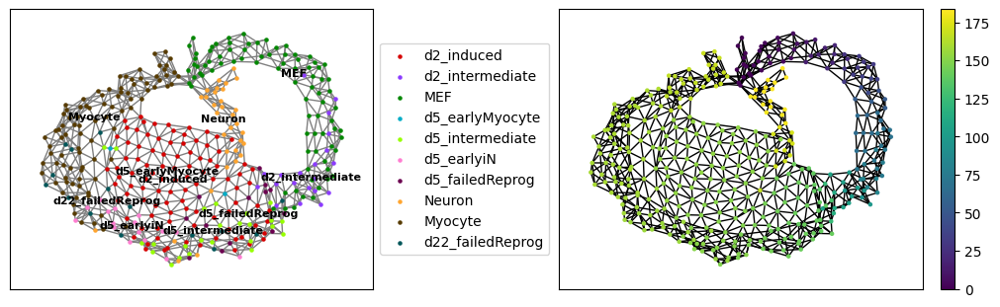

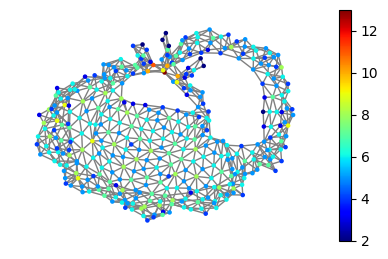

In [8]:
fig, ax = plt.subplots(1,2, figsize=(10, 3), constrained_layout=True)
phlower.pl.nxdraw_group(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle',node_size=5, show_edges=True, labelstyle='text',labelsize=8, show_legend=True, ax = ax[0])
phlower.pl.nxdraw_score(adata, graph_name='X_pca_ddhodge_g_triangulation_circle',layout_name='X_pca_ddhodge_g_triangulation_circle', colorbar=True,node_size=5, label=False, ax=ax[1])

fig, ax = plt.subplots(1,1, figsize=(5, 3))
phlower.pl.plot_triangle_density(adata, "X_pca_ddhodge_g_triangulation_circle", "X_pca_ddhodge_g_triangulation_circle", colorbar=True, edge_color='gray', ax = ax, node_size=5)


### Graph holdge laplacian
In here, we first get normlized hodge laplacian and perform eigen decomposition to get the signals on edges

In [9]:
phlower.tl.L1Norm_decomp(adata)

0.15503668785095215  sec


We can check the eigen vectors(harmonic) with eigen vectors = 0

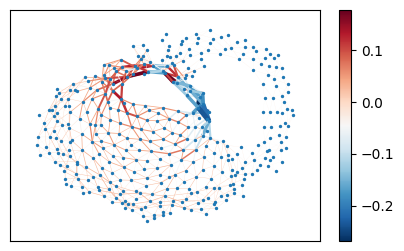

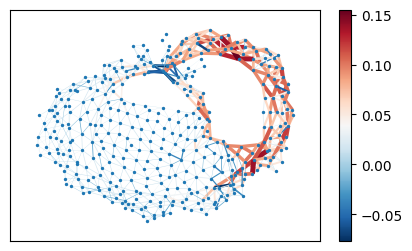

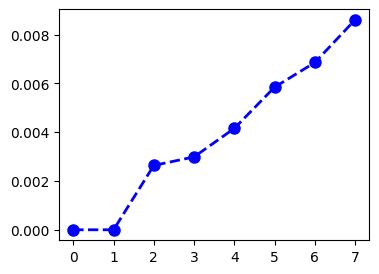

In [10]:
figs = []

fig, ax = plt.subplots(1,1, figsize=(5, 3))
phlower.pl.nxdraw_holes(adata, vector_dim=0,arrows=False, width=4, node_size=2, ax=ax, colorbar=True)

fig, ax = plt.subplots(1,1, figsize=(5, 3))
phlower.pl.nxdraw_holes(adata, vector_dim=1,arrows=False, width=4, node_size=2, ax=ax, colorbar=True)


fig, ax = plt.subplots(1,1, figsize=(4, 3))
phlower.pl.plot_eigen_line(adata, n_eig=8, linewidth='2', markersize=8,  show_legend=False, ax=ax)

Check how many harmonic functions by checking 0 eigen values 

In [11]:
phlower.tl.knee_eigen(adata)

knee eigen value is  2


### Preference random walk


In [12]:
phlower.tl.random_climb_knn(adata, n=10000)

100%|██████████| 10000/10000 [00:04<00:00, 2116.66it/s]


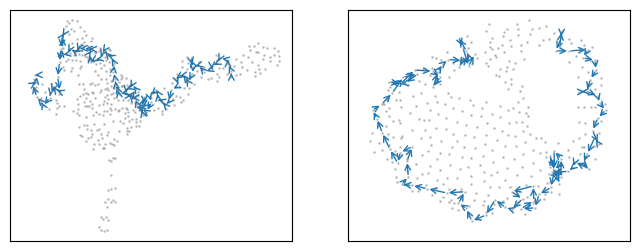

In [13]:
#G_ae.nodes(data=True)
from scipy import constants
fig_width = 9
fig, axs = plt.subplots(1, 2,figsize=(8, 3))
phlower.pl.plot_traj(adata, trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[0])
phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[1])


### Project trajectories to harmonic space

In [14]:
phlower.tl.trajs_matrix(adata)

2024-09-27 10:39:25.716062 projecting trajectories to simplics...
2024-09-27 10:39:32.647217 Embedding trajectory harmonics...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use: 2
eigen_n is 2, use itsself as embedding
2024-09-27 10:39:32.739772 done.


### dbscan clustering on the culmulative trajectory space

In [15]:
from collections import Counter
phlower.tl.trajs_clustering(adata,  eps=0.5)
Counter(adata.uns['trajs_clusters'])

Counter({0: 9276, 1: 724})

In [16]:
c0 = np.where(adata.uns['trajs_clusters'] == 0)[0]
c1 = np.where(adata.uns['trajs_clusters'] == 1)[0]

### plot clustered trajectories on the graph

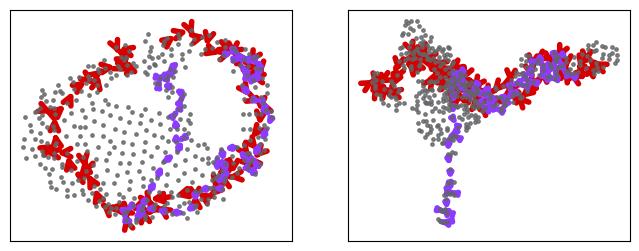

In [17]:
fig1, ax = plt.subplots(1,2, figsize=(8,3))
import colorcet as cc
color_palette = sns.color_palette(cc.glasbey, n_colors=50).as_hex()
phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g_triangulation_circle", trajectory=list(np.array(adata.uns['knn_trajs'], dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[0], edge_width=4,alpha=1, color_palette=color_palette, arrowsize=15)
def edges_on_path(path):
    return zip(path, path[1:])

for a_traj in list(np.array(adata.uns['knn_trajs'], dtype=object)[c1[[2]]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g_triangulation_circle'],
                                       ax=ax[0],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=4,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=5,
                                       alpha=1
                                      )
        
        


phlower.pl.plot_traj(adata, layout_name="X_pca_ddhodge_g", trajectory=list(np.array(adata.uns['knn_trajs'],dtype=object)[c0[9]]), colorid=0, node_size=6, alpha_nodes=.8, ax=ax[1], edge_width=4,alpha=1, color_palette=color_palette, arrowsize=15)
for a_traj in list(np.array(adata.uns['knn_trajs'],dtype=object)[c1[[2]]]):
                nx.draw_networkx_edges(adata.uns['X_pca_ddhodge_g_triangulation_circle'],
                                       adata.obsm['X_pca_ddhodge_g'],
                                       ax=ax[1],
                                       edgelist=list(edges_on_path(a_traj)),
                                       node_size=10,
                                       width=4,
                                       edge_color=color_palette[1],
                                       arrows=True,
                                       arrowstyle='->',
                                       arrowsize=5,
                                       alpha=1
                                      )


            

### harmonic space for the two trajectory clusters

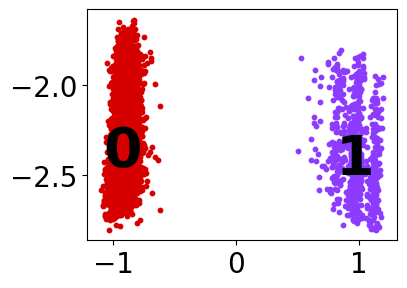

In [18]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

_, ax = plt.subplots(1,1, figsize=(4,3))
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters",show_legend=False, labelsize=40, node_size=10, ax=ax)

### Create stream tree in harmonic space
`trajs_use`: how many trajectories to use

`trajs_clusters`: trajectory clusters

`min_bin_number`: Bin each trajectory group by pseudo time, the minimu bins for the shortest trajectory

`cut_threshold`: 1 by default, for the tree creating, in the harmonic space.

`eigen_n`: how many harmonic functions to use, default = -1 will use all.

In [19]:
phlower.tl.harmonic_stream_tree(adata,
                                trajs_use=10000,
                                trajs_clusters='trajs_clusters',
                                min_bin_number=20,
                                cut_threshold=1, 
                                layout_name='cumsum',
                                eigen_n=-1)

eigen_n < 1, use knee_eigen to find the number of eigen vectors to use
eigen_n: 2
{0, 1}


traj bins: 100%|██████████| 2/2 [00:11<00:00,  5.64s/it]


[(0, 1)]


edges projection: 100%|██████████| 10000/10000 [00:06<00:00, 1431.40it/s]


pseudo time bins for each trajectory group, and the tree created

Now we can plot the tree using STREAM

None
{'S0': '1_21', 'S3': '2_21', 'S1': '0_17', 'S2': 'root'}


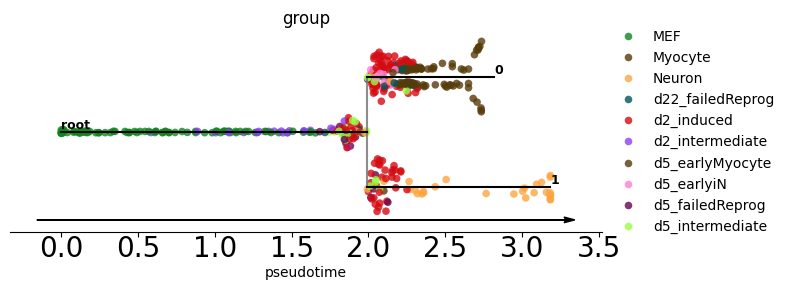

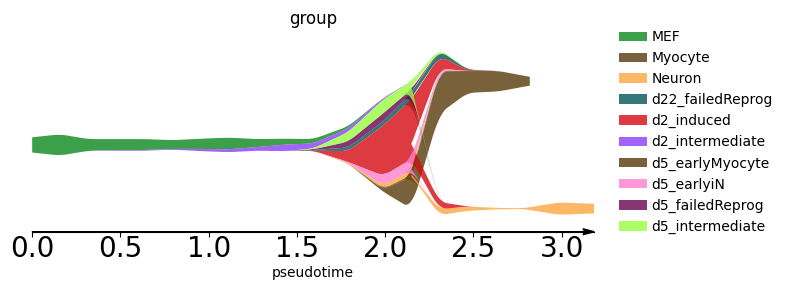

In [20]:
celltype_colors = {
    "MEF": "#0b871c",
    "Neuron": "#fea541",
    "d2_induced": "#d50a11",
    "d2_intermediate": "#8b3df9",
    "d5_earlyMyocyte":"#573b0a",
    "d5_earlyiN":"#fe7fce",
    "d5_failedReprog": "#6a034d",
    "d5_intermediate":"#99fe40",
    "d22_failedReprog":"#035659",
    "Myocyte":"#573b0a",
}

adata.uns['group_color'] = celltype_colors 
fig1 = phlower.ext.plot_stream_sc(adata, color=['group'], show_text=True, show_graph=True, show_legend=True, fig_size=(8,3), s=30, return_fig=True, dist_scale=.4)
fig2 = phlower.ext.plot_stream(adata, color=['group'], show_legend=True, fig_size=(8,3), return_fig=True, dist_scale=1)


Trajectories in harmonic space, and culmulative harmonic space.

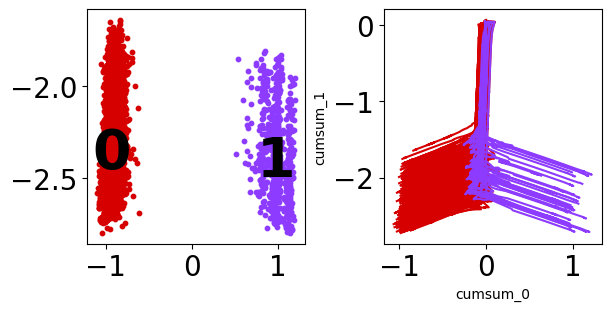

In [21]:
figs = []
fig, ax = plt.subplots(1,2, figsize=(6,3),  constrained_layout=True)
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters",show_legend=False, labelsize=40, node_size=10, ax=ax[0])
phlower.pl.plot_trajectory_harmonic_lines(adata, sample_ratio=0.05, show_legend=False, ax=ax[1]) 

In [22]:
phlower.pl.plot_trajectory_harmonic_lines_3d(adata, sample_ratio=.1, show_legend=True, fig_path=None) 

In [23]:
phlower.pl.plot_trajectory_harmonic_points_3d(adata, sample_ratio=.1, show_legend=True, fig_path=None) 


3


We also visualize the trajectories using velocity stream plots.

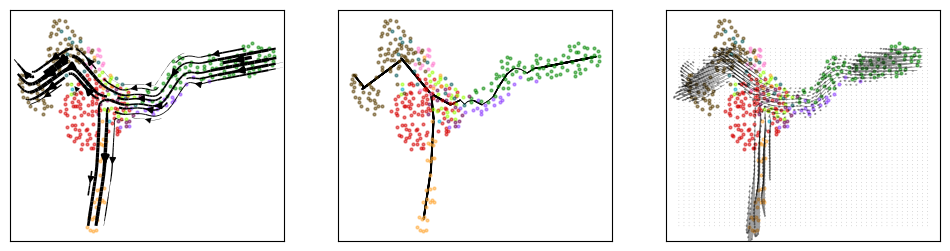

In [24]:
figs = []
fig, ax = plt.subplots(1,3, figsize=(12, 3))
phlower.pl.fate_velocity_plot(adata, group_name='group',figtype='stream', ax=ax[0], show_legend=False, radius=100, maxlinewidth=10, embedd_label=False)
phlower.pl.fate_velocity_plot(adata, group_name='group',node_alpha=.5,figtype='point', ax=ax[1], show_legend=False, embedd_label=False)
phlower.pl.fate_velocity_plot(adata, group_name='group',node_alpha=.5,figtype='grid', ax=ax[2], show_legend=False, embedd_label=False, radius=100)

Leaf markers and transition markers

In [25]:
import pickle
import os
from datetime import date

if not os.path.exists("save"):
    os.mkdir('save')

today_ = date.today().strftime("%Y-%m-%d")
pickle.dump(adata, open(f"save/fib2neuron_{today_}.pickle", 'wb'))